In [1]:
!gpustat

ltgpu2                         Tue Jan 25 15:12:54 2022  470.57.02
[0] NVIDIA GeForce RTX 2080 Ti | 31'C,   0 % |     3 / 11019 MB |
[1] NVIDIA GeForce GTX 1080 Ti | 75'C,  97 % | 11173 / 11178 MB | nair(11169M)
[2] NVIDIA GeForce RTX 2080 Ti | 73'C,  66 % |  9238 / 11019 MB | 8wiehe(9235M)
[3] NVIDIA GeForce GTX 1080 Ti | 22'C,   0 % |     4 / 11178 MB |
[4] NVIDIA GeForce GTX 1080 Ti | 23'C,   0 % |     4 / 11178 MB |
[5] NVIDIA TITAN Xp            | 18'C,   0 % |     4 / 12196 MB |
[6] NVIDIA GeForce GTX 1080 Ti | 18'C,   0 % |     4 / 11178 MB |
[7] NVIDIA GeForce RTX 2080 Ti | 70'C,  40 % |  8964 / 11019 MB | 8wiehe(8961M)


In [2]:
import os
import pandas as pd
from PIL import Image
import numpy as np

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [3]:
from dataset_utils import load_dataset

dataset_name = "mimic-cxr"
df, label_names = load_dataset(dataset_name)

In [4]:
from clip_utils import get_clip_img_caption_features

img_features, caption_features = get_clip_img_caption_features(df, "ViT-B_16", None, dataset_name)

/srv/home/8wiehe/.local/lib/python3.8/site-packages/clip/clip.py:23: UserWarning: PyTorch version 1.7.1 or higher is recommended
  warnings.warn("PyTorch version 1.7.1 or higher is recommended")


In [5]:
import sys
sys.path.append("../CLIPGuidance/")

import importlib
import style_clip
importlib.reload(style_clip)
import style_clip
from style_clip import Imagine

In [60]:
net = "image"

if net == "dip":
    kwargs = {"model_type": "dip",
              "lr": 0.0003,
              "dip_num_scales": 5,
              "stack_size": 3,
             }
elif net == "image":
    kwargs = {"model_type": "image",
              "lr": 0.03,
              "stack_size": 8,
             }
elif net == "vqgan":
    kwargs = {"model_type": "vqgan",
              "lr": 0.1,
              "stack_size": 1,
             }
    
kwargs["lpips_image"] = None #df["img_path"].iloc[0]
kwargs["lpips_weight"] = 1000
kwargs["lpips_batch_size"] = 8
kwargs["use_mixed_precision"] = False


imagine = Imagine(save_gif=False, save_video=False, save_progress=False, verbose=False,
                          sideX = 256, 
                          sideY = 256,
                          batch_size=8,
                          #clip_models=[self.model],
                          clip_names=('ViT-B/16',),
                          grayscale=True,
                          tv_loss_scale=1.0,
                          seed=42,
                          use_russell_transform=1,
                          optimizer="AdamW",#"MADGRAD",
                          **kwargs
                         )

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /srv/home/8wiehe/.local/lib/python3.8/site-packages/lpips/weights/v0.1/vgg.pth


In [57]:
target_img = None #Image.open(df["img_path"].iloc[0]).convert("RGB")
text = "An X-ray scan of the chest of a person with consolidation" #df["caption"].iloc[0]
encoding = None #[img_features.mean(dim=0).to(imagine.device)] #caption_features.mean(dim=0).to(imagine.device)
display(target_img)
print(text)

None

An X-ray scan of the chest of a person with consolidation


  0%|          | 0/100 [00:00<?, ?it/s]

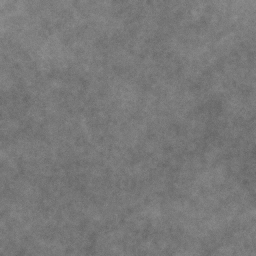

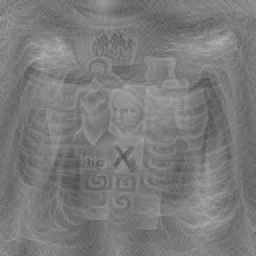

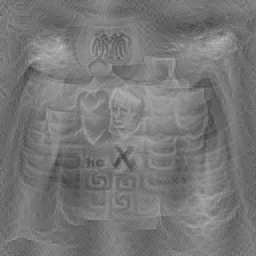

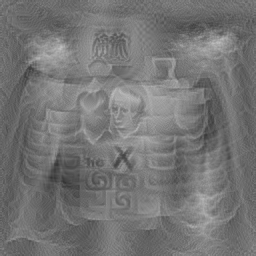

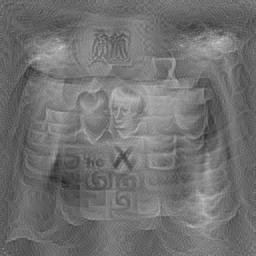

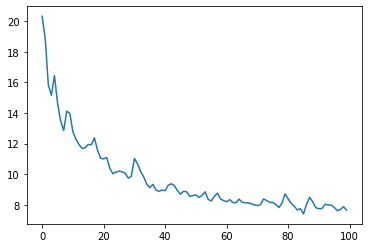

In [58]:
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage
from IPython.display import display

steps = 100

to_pil = ToPILImage()

imagine.reset()
imagine.set_clip_encoding(img=target_img, text=text, encoding=encoding)

losses = []
pbar = tqdm(range(steps))
for i in pbar:
    img, loss = imagine.train_step(0, 0)
    loss = loss.cpu().item()
    losses.append(loss)
    pbar.set_description(str(round(loss, 1)))
    if i % (steps // 5) == 0:
        display(to_pil(img.squeeze()))
p = plt.plot(losses)

37 197


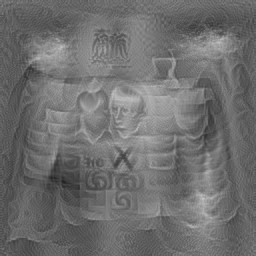

In [59]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

55 222


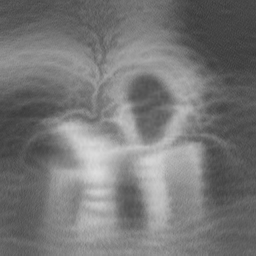

In [55]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

4 217


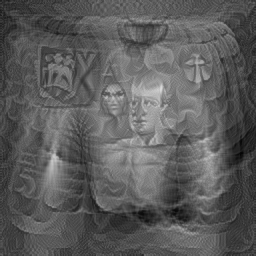

In [51]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

21 232


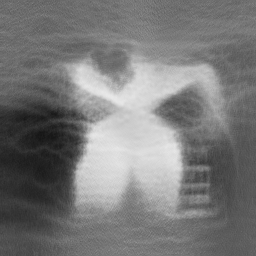

In [47]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

13 239


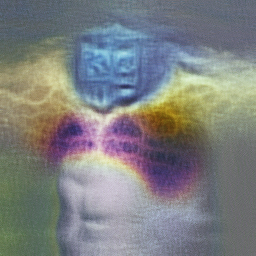

In [43]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 255


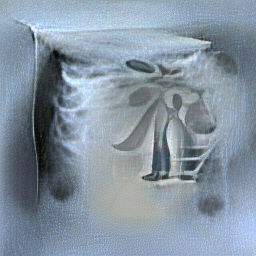

In [37]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 255


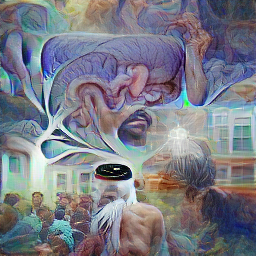

In [33]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

4 249


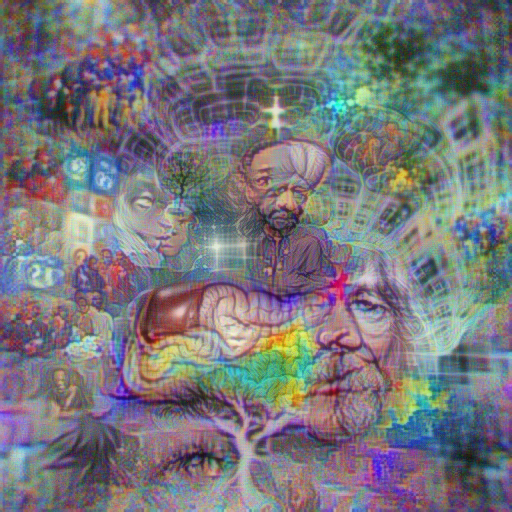

In [29]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

3 76


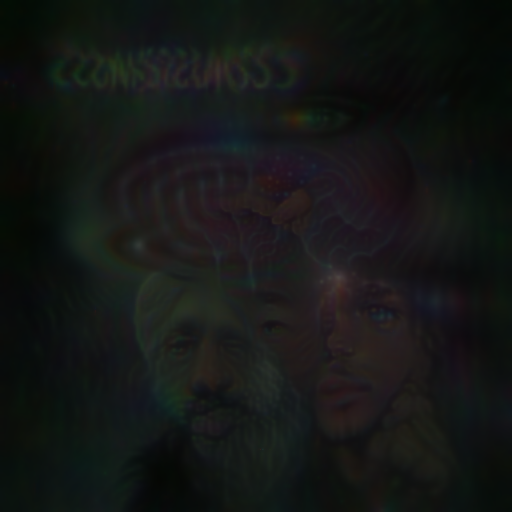

In [24]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 101


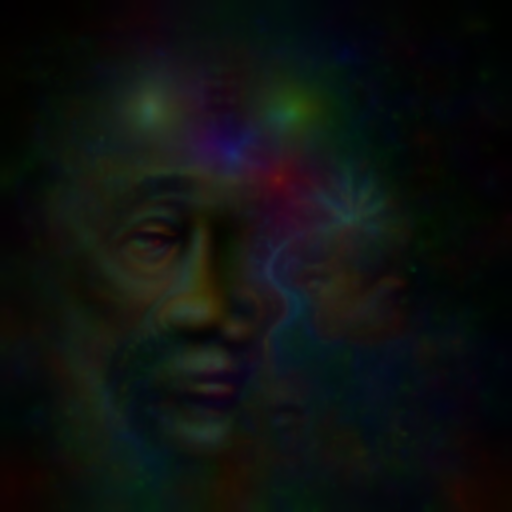

In [20]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 254


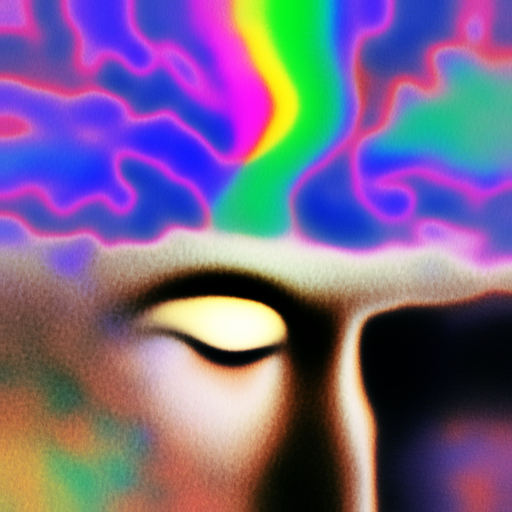

In [16]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

2 252


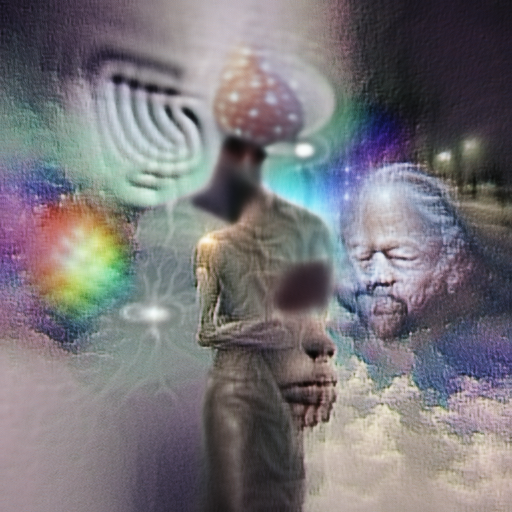

In [12]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

1 252


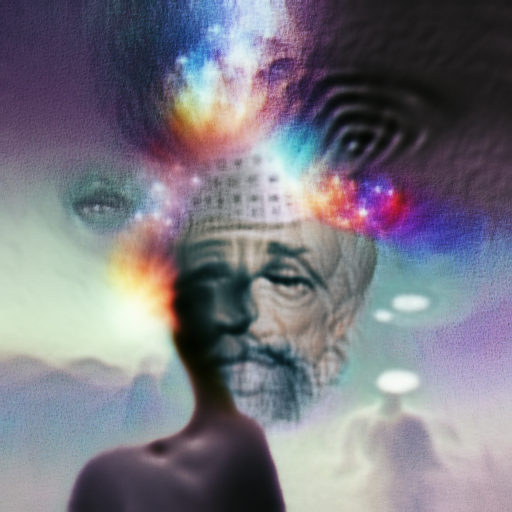

In [30]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 254


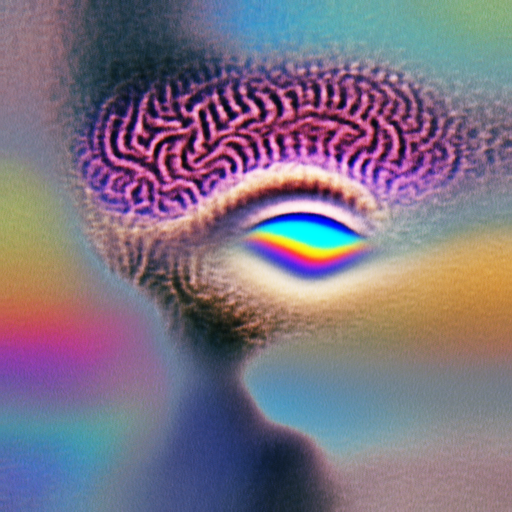

In [26]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 254


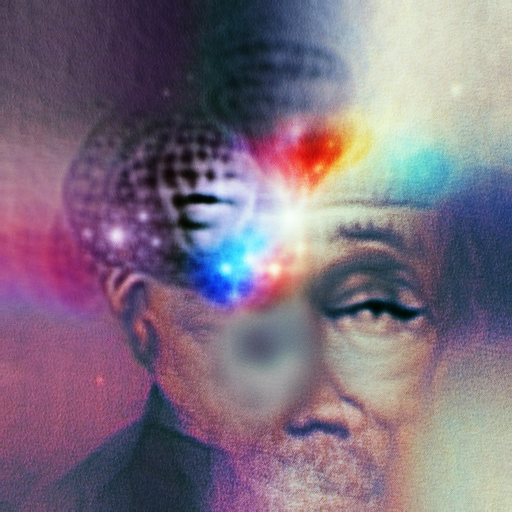

In [20]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

4 249


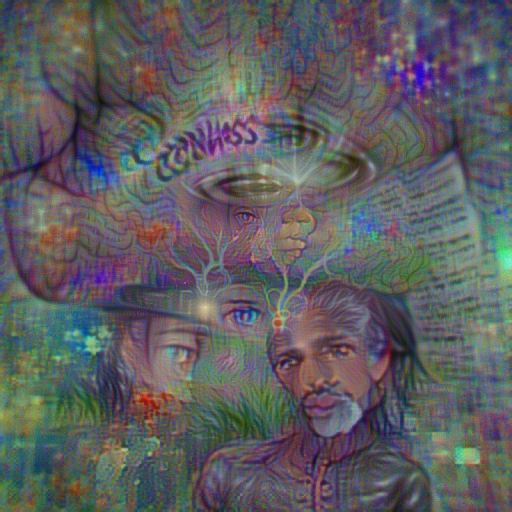

In [16]:
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

1 234


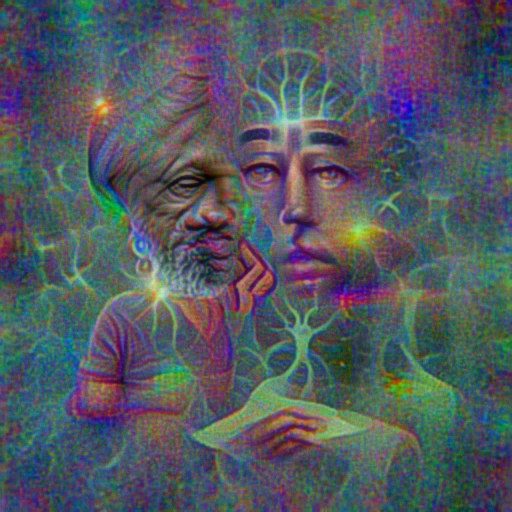

In [67]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

4 198


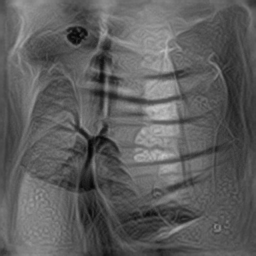

In [46]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

4 215


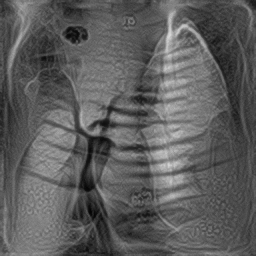

In [38]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 249


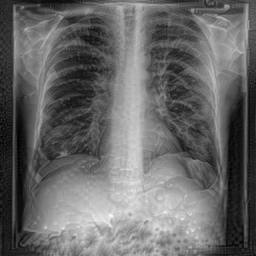

In [34]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

17 203


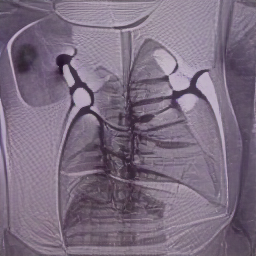

In [26]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 255


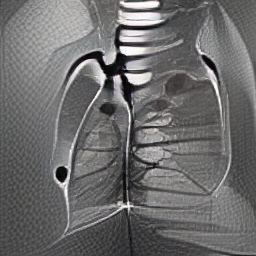

In [22]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

61 251


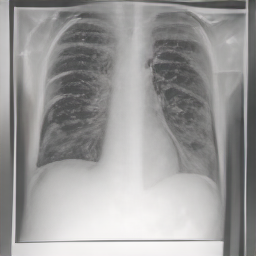

In [30]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 255


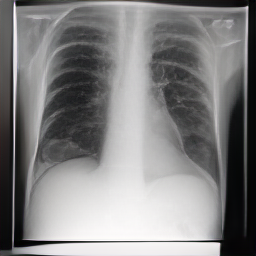

In [13]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

64 230


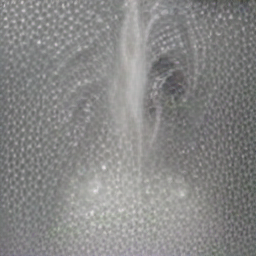

In [9]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 244


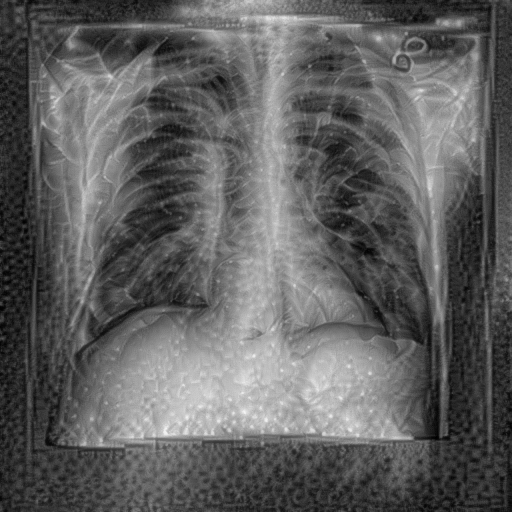

In [13]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 239


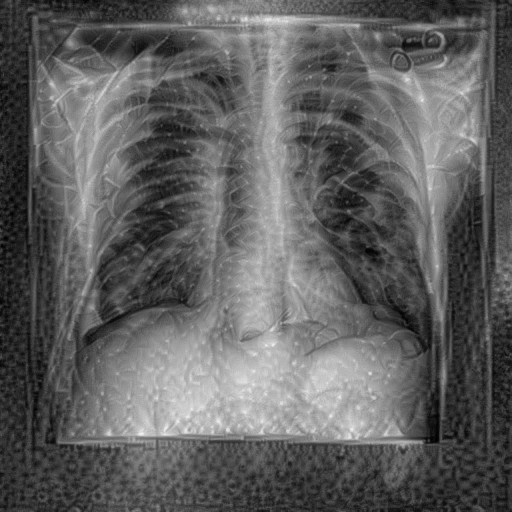

In [9]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

1 254


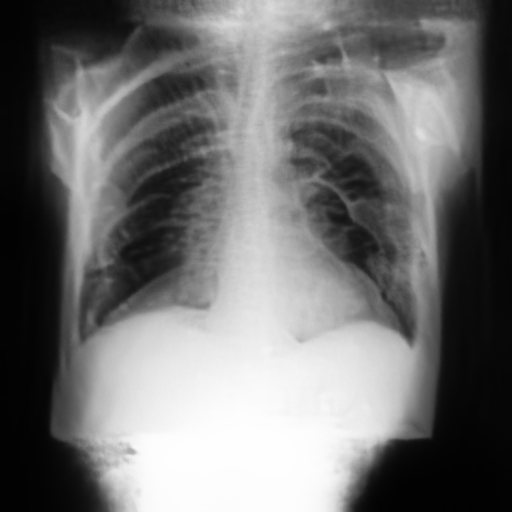

In [15]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

0 255


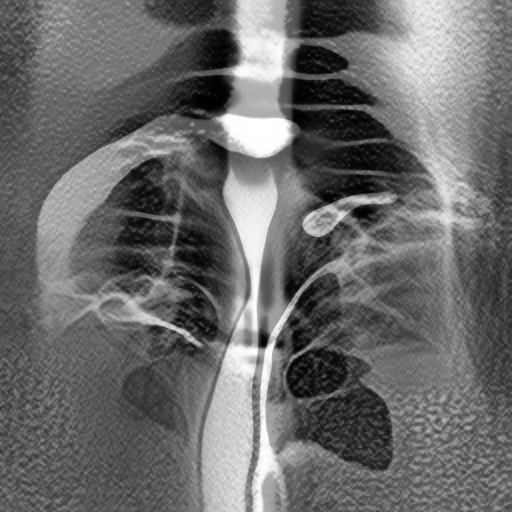

In [26]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

1 250


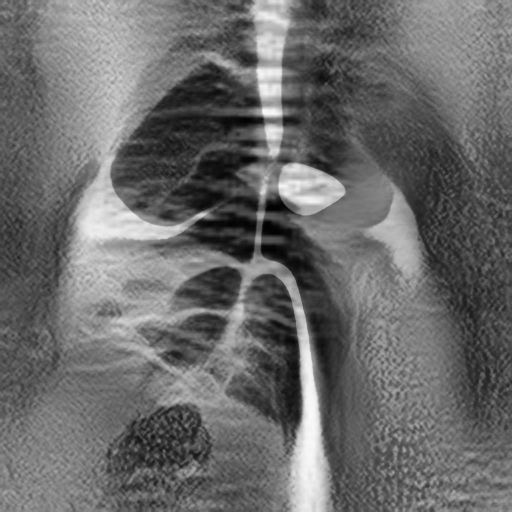

In [24]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

2 249


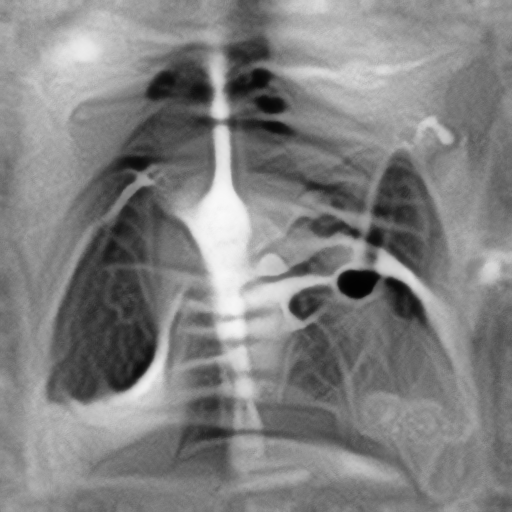

In [20]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

6 234


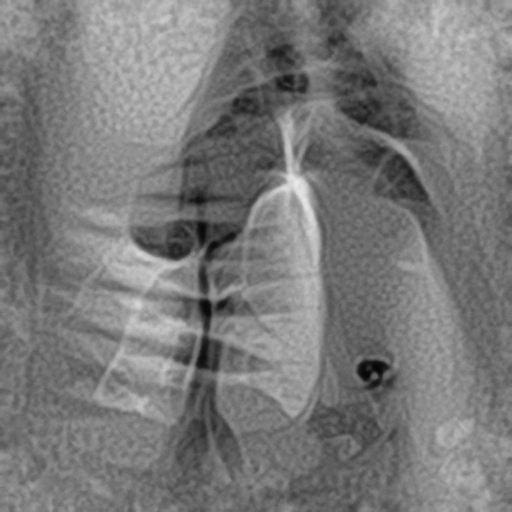

In [16]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

5 236


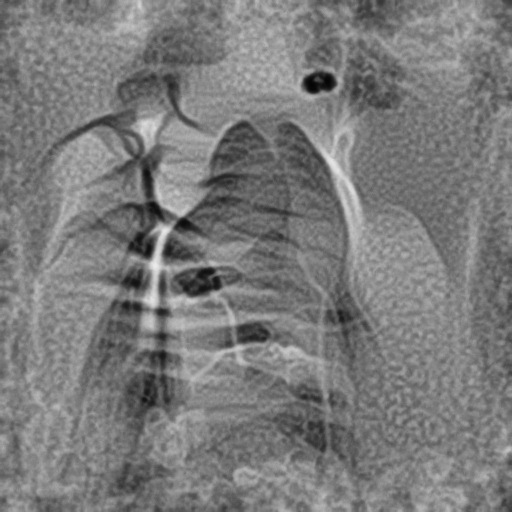

In [12]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
pil_img = to_pil(img.squeeze())
print(np.min(pil_img), np.max(pil_img))
display(pil_img)

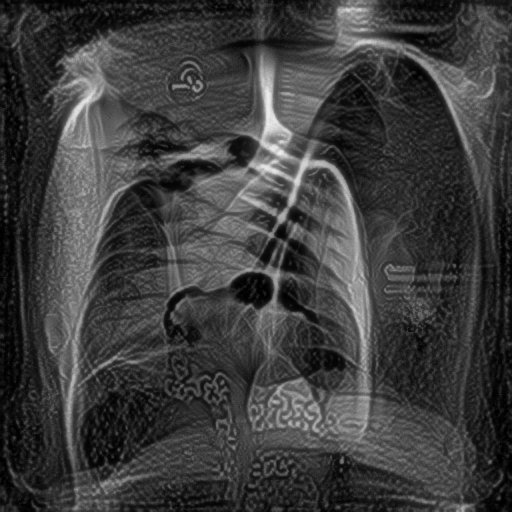

In [73]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

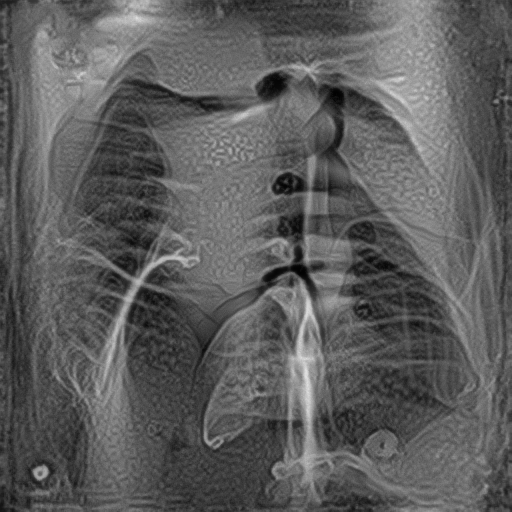

In [71]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

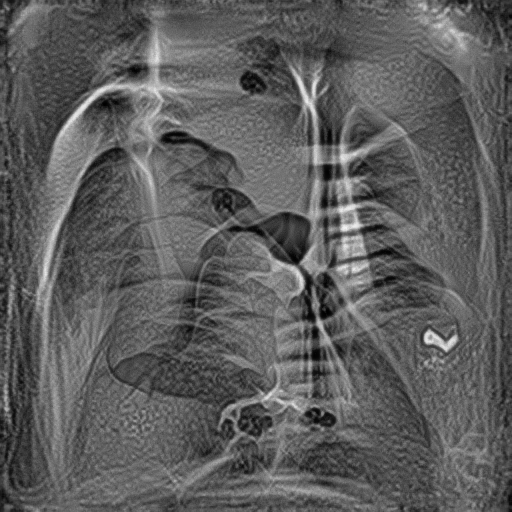

In [61]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

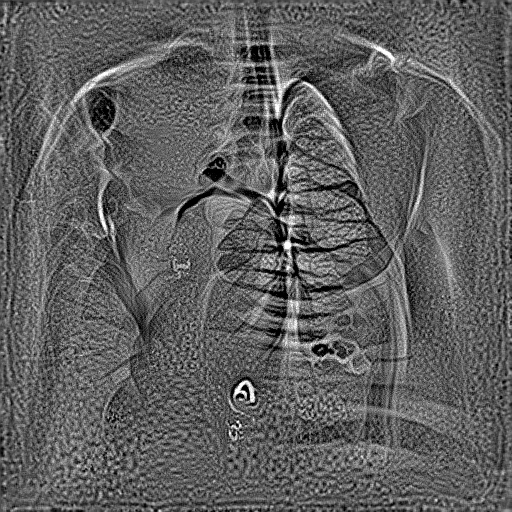

In [57]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

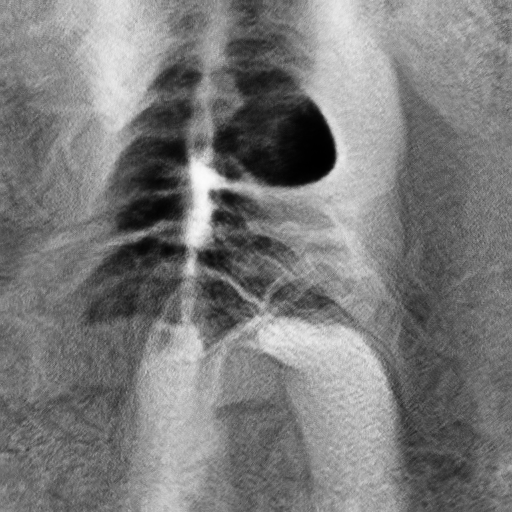

In [42]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

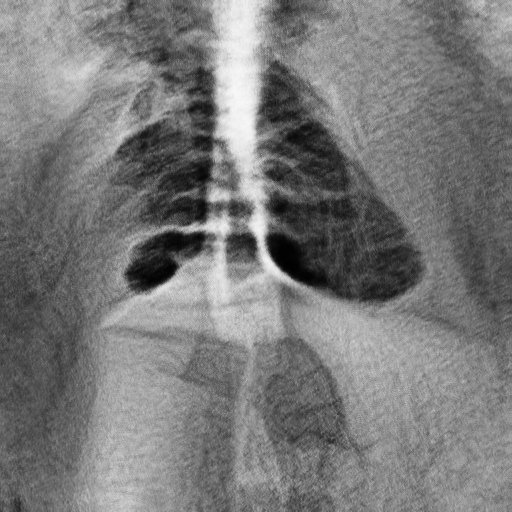

In [38]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

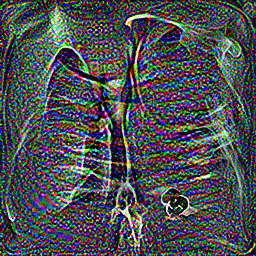

In [43]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

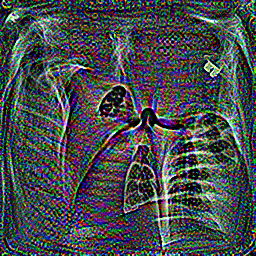

In [21]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

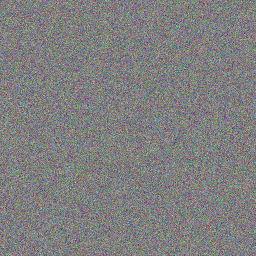

In [16]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))

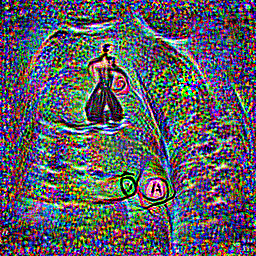

In [11]:
from torchvision.transforms import ToPILImage
from IPython.display import display

to_pil = ToPILImage()
display(to_pil(img.squeeze()))